In [21]:
#so now we have the cleaned data, we can use it for EDA. 
#first load in the files an dmake sure the shapes are correct

import pandas as pd
import os
os.chdir('/home/sarthak/cornell/Krumsiek/')

# Load the Metabolomics data
metabolomics_file_path = 'UKBB_300K_Overlapping_MET.csv'
metabolomics_df = pd.read_csv(metabolomics_file_path, index_col=0)

# Load the Proteomics data (Olink)
proteomics_file_path = 'UKBB_300K_Overlapping_OLINK.csv'
proteomics_df = pd.read_csv(proteomics_file_path, index_col=0)

# Display the first few rows of each dataset to get an idea of the structure
print(metabolomics_df.shape, proteomics_df.shape)
print(metabolomics_df.iloc[:5,:5], proteomics_df.iloc[:5,:5])


(27337, 251) (27337, 1461)
         X20280.0.0  X20281.0.0  X23400.0.0  X23401.0.0  X23402.0.0
eid                                                                
1000048     5.40831    0.356626      3.1318      2.2874      1.3544
1000072     5.14215    0.298960      4.7800      3.5149      1.8861
1000256     4.88465    0.247446      3.9839      2.8529      1.4881
1000364     4.64465    0.334969      3.9174      2.6216      1.1558
1000700     5.83259    0.330799      5.2370      4.0868      2.0246            1693    1719     1733    1732     1731
eid                                              
1000048  1.2716 -0.0034  0.58190  1.1194 -1.46535
1000072  0.1365 -0.2222  1.12845  0.6091  1.77295
1000256  0.8185  0.6949  0.95770  0.7030  1.54085
1000364 -0.1250  0.1200 -0.43900 -0.7983  0.49570
1000700 -0.2756  0.0914  0.52820  0.8408  1.36460


In [22]:
#now turn to np arrays
import numpy as np

met = metabolomics_df.to_numpy()
prot = proteomics_df.to_numpy()
print(met.shape, prot.shape)
print(met[:5,:5], prot[:5,:5])

(27337, 251) (27337, 1461)
[[5.40831  0.356626 3.1318   2.2874   1.3544  ]
 [5.14215  0.29896  4.78     3.5149   1.8861  ]
 [4.88465  0.247446 3.9839   2.8529   1.4881  ]
 [4.64465  0.334969 3.9174   2.6216   1.1558  ]
 [5.83259  0.330799 5.237    4.0868   2.0246  ]] [[ 1.2716  -0.0034   0.5819   1.1194  -1.46535]
 [ 0.1365  -0.2222   1.12845  0.6091   1.77295]
 [ 0.8185   0.6949   0.9577   0.703    1.54085]
 [-0.125    0.12    -0.439   -0.7983   0.4957 ]
 [-0.2756   0.0914   0.5282   0.8408   1.3646 ]]


In [24]:
#find how many columns have nan
count = 0
for i in range(prot.shape[1]):
    if np.isnan(prot[:,i]).any():
        count = count + 1
print(count)

#now find how many rows have nan

count = 0
for i in range(prot.shape[0]):
    if np.isnan(prot[i,:]).any():
        count = count + 1
print(count)

1461
21360


In [25]:
#now we'll do imputation to handle the nan values, simply do mean imputation

from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(prot)
prot = imp.transform(prot)

count = 0
for i in range(prot.shape[0]):
    if np.isnan(prot[i,:]).any():
        count = count + 1
print(count)

0


In [26]:
#now let's z score normalize the data

def z_score_normalize(data):
    mean = np.mean(data, axis=0)
    std = np.std(data, axis=0)
    return (data - mean)/std

prot = z_score_normalize(prot)

print(np.std(prot[:,100]))
print(np.mean(prot[:,100]))

1.0
4.418636466299047e-18


In [27]:
#and metabolomics!

met = z_score_normalize(met)

print(np.std(met[:,100]))
print(np.mean(met[:,100]))

1.0
-2.4562420356779993e-17


In [28]:
#now we're going to go ahead and do a cross correlation plot by using PCA
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
def perform_pca(mat, n_components=10):
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(mat)
    #pca_df = pd.DataFrame(data=pca_result, columns=[f'PC{i+1}' for i in range(n_components)], index=df.dropna().index)
    return pca_result

n = 10

pca_met = perform_pca(met, n_components=n)
pca_prot = perform_pca(prot, n_components=n)

print(pca_met.shape, pca_prot.shape)

(27337, 10) (27337, 10)


In [30]:
print(pca_met[:5,:5], pca_prot[:5,:5])

[[-5.0779194   6.35439505 -4.04289532 27.14599774 14.35769918]
 [16.82868078 10.65610325  8.49790326  5.28239485  0.49574322]
 [-3.01474638  3.33380221 -1.18515573  3.48220708 -0.36488372]
 [-9.23834668  0.55408454 -1.81997166 -2.97107367  1.9314563 ]
 [ 9.11022569 -0.88212247 -3.09588232  0.56578047 -0.2731383 ]] [[ 1.84510710e+00  2.89287690e+01 -3.06368098e+00 -2.43835837e-01
  -6.83611275e+00]
 [ 1.79432941e+01 -1.00177249e+01  9.82250585e-01  9.90067363e-03
  -3.00509811e-01]
 [ 1.12723139e+01 -2.33107990e+00 -7.31847203e+00 -2.76771971e+00
  -2.64114289e+00]
 [-1.49692930e+01 -4.83866567e+00 -8.92799374e-01 -4.92956090e-01
   1.57891052e+00]
 [ 1.47552614e+01 -7.64680519e+00  6.42641875e+00 -3.52003916e+00
   5.77138513e+00]]


In [32]:
metdf = pd.DataFrame(data=pca_met, columns=[f'PC{i+1}' for i in range(n)])
protdf = pd.DataFrame(data=pca_prot, columns=[f'PC{i+1}' for i in range(n)])
ccm = metdf.corrwith(protdf, axis=0)
metdf.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-5.077919,6.354395,-4.042895,27.145998,14.357699,-3.633614,7.094806,9.745863,-3.997742,1.026325
1,16.828681,10.656103,8.497903,5.282395,0.495743,-2.838658,-1.464432,0.100479,-0.503639,-2.400818
2,-3.014746,3.333802,-1.185156,3.482207,-0.364884,-3.327693,-0.054047,-2.553669,0.322848,0.012442
3,-9.238347,0.554085,-1.819972,-2.971074,1.931456,1.293403,-2.196192,1.900568,-1.662001,-0.421283
4,9.110226,-0.882122,-3.095882,0.565780,-0.273138,-4.453029,-0.885724,3.108811,-2.870580,0.698959


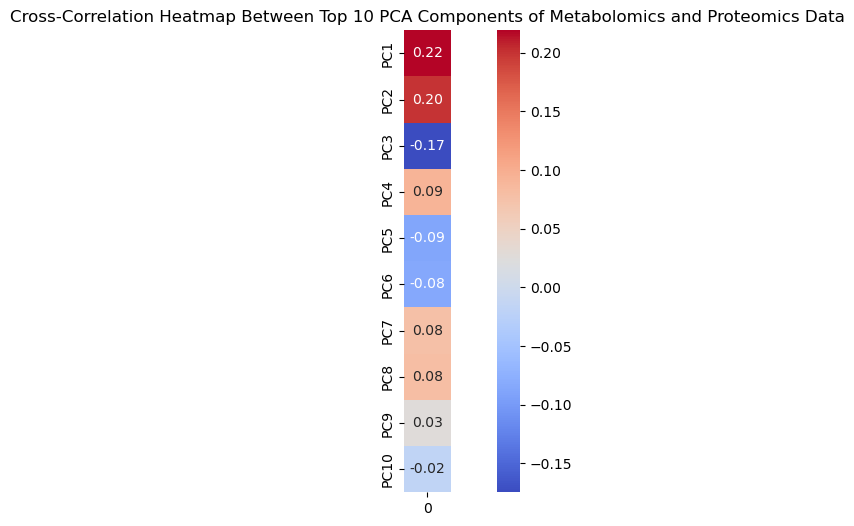

In [33]:

plt.figure(figsize=(12, 6))
sns.heatmap(ccm.to_frame(), annot=True, cmap='coolwarm', cbar=True, square=True, fmt='.2f')
plt.title('Cross-Correlation Heatmap Between Top 10 PCA Components of Metabolomics and Proteomics Data')
plt.show()

In [38]:
#let's do a cross correlation matrix using numpy

# Function to calculate cross-correlation matrix between two numpy arrays
def cross_correlation_matrix(array1, array2):
    # Step 1: Center the data (subtract mean of each feature from itself)
    centered_array1 = array1 - np.mean(array1, axis=0)
    centered_array2 = array2 - np.mean(array2, axis=0)
    
    # Step 2 and 3: Calculate the cross-correlation and store the results
    # Initialize an empty matrix to store the results
    cross_corr_mat = np.zeros((array1.shape[1], array2.shape[1]))
    
    for i in range(array1.shape[1]):
        for j in range(array2.shape[1]):
            numerator = np.sum(centered_array1[:, i] * centered_array2[:, j])
            denominator = np.sqrt(np.sum(centered_array1[:, i]**2) * np.sum(centered_array2[:, j]**2))
            
            # Handle the case where the denominator is zero
            if denominator == 0:
                cross_corr_mat[i, j] = 0
            else:
                cross_corr_mat[i, j] = numerator / denominator
                
    return cross_corr_mat


# Calculate the cross-correlation matrix between the two sample arrays
ccm = cross_correlation_matrix(pca_met, pca_prot)

# Show the resulting cross-correlation matrix
print(ccm.shape)

(10, 10)


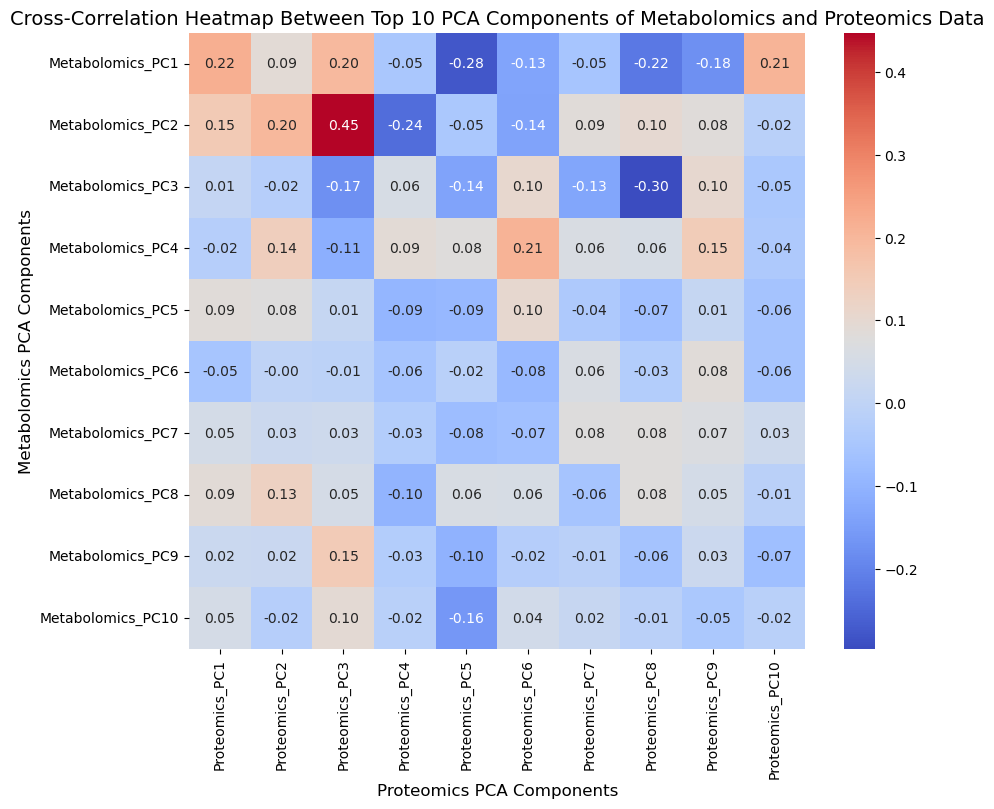

In [42]:
#now do a heatmap

plt.figure(figsize=(10, 8))
sns.heatmap(ccm, annot=True, cmap='coolwarm', cbar=True, square=True, fmt='.2f',
            xticklabels=[f'Proteomics_PC{i+1}' for i in range(ccm.shape[1])],
            yticklabels=[f'Metabolomics_PC{i+1}' for i in range(ccm.shape[0])])
plt.title('Cross-Correlation Heatmap Between Top 10 PCA Components of Metabolomics and Proteomics Data', fontsize=14)
plt.xlabel('Proteomics PCA Components', fontsize=12)
plt.ylabel('Metabolomics PCA Components', fontsize=12)
plt.show()

In [43]:
#now do canonical correlation analysis

from sklearn.cross_decomposition import CCA

# Initialize CCA with the number of components to learn from the data
cca = CCA(n_components=2)

# Fit the CCA model on your data
cca.fit(met, prot)

# Transform input data to the canonical space
X_c, Y_c = cca.transform(met, prot)

# X_c and Y_c now contain the canonical variables
print(X_c.shape, Y_c.shape)

(27337, 2) (27337, 2)


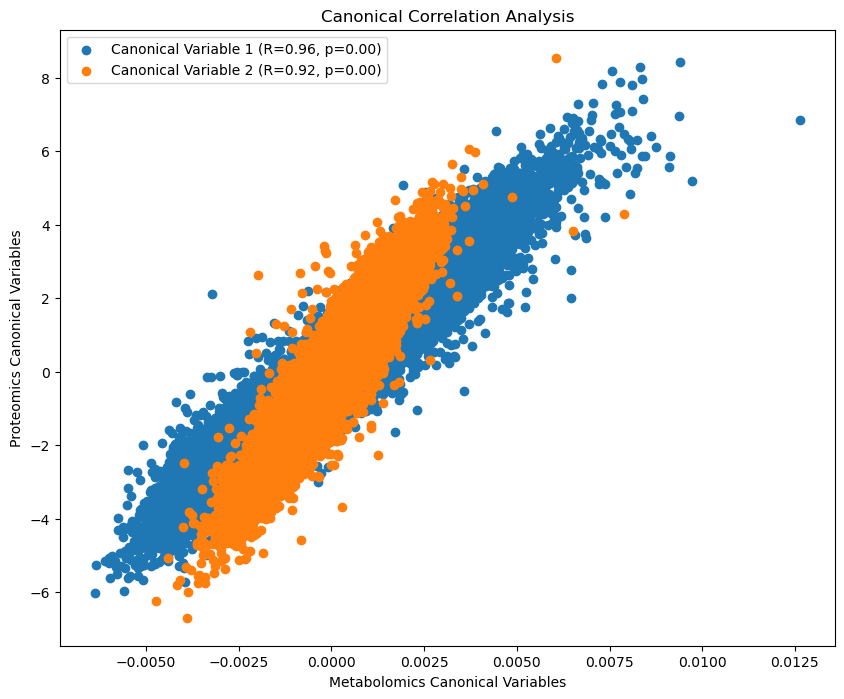

In [48]:
import matplotlib.pyplot as plt
import scipy.stats
R1, p1 = scipy.stats.pearsonr(X_c[:, 0], Y_c[:, 0])
R2, p2 = scipy.stats.pearsonr(X_c[:, 1], Y_c[:, 1])

plt.figure(figsize=(10, 8))
plt.scatter(X_c[:, 0], Y_c[:, 0], label=f'Canonical Variable 1 (R={R1:.2f}, p={p1:.2f})')
plt.scatter(X_c[:, 1], Y_c[:, 1], label=f'Canonical Variable 2 (R={R2:.2f}, p={p2:.2f})')
plt.xlabel('Metabolomics Canonical Variables')
plt.ylabel('Proteomics Canonical Variables')
plt.legend()
plt.title('Canonical Correlation Analysis')
plt.show()

#canonical correlation, here have 2 canonical variables. Shows at least 2 major dimensions that are relatively correlated, so some of these
#metabolites are highly correlated with the proteins

#noto that important cuz we also need to consider that if just a few are highly correlated, then first n components will be
#other canonical variables are orthogonal to each other, so they are not correlated, so means many terms are correlated

In [ ]:
#let's also do R2 for a 
import numpy as np
from sklearn.cross_decomposition import CCA
import scipy.stats
import matplotlib.pyplot as plt

# Initialize CCA with 100 components
cca = CCA(n_components=20)
cca.fit(met,prot)

# Transform the datasets into the canonical space
X_c, Y_c = cca.transform(met, prot)

# Calculate R^2 and p-values for each pair of canonical variables
R2_values = []
p_values = []

for i in range(100):
    R, p = scipy.stats.pearsonr(X_c[:, i], Y_c[:, i])
    R2_values.append(R ** 2)
    p_values.append(p)

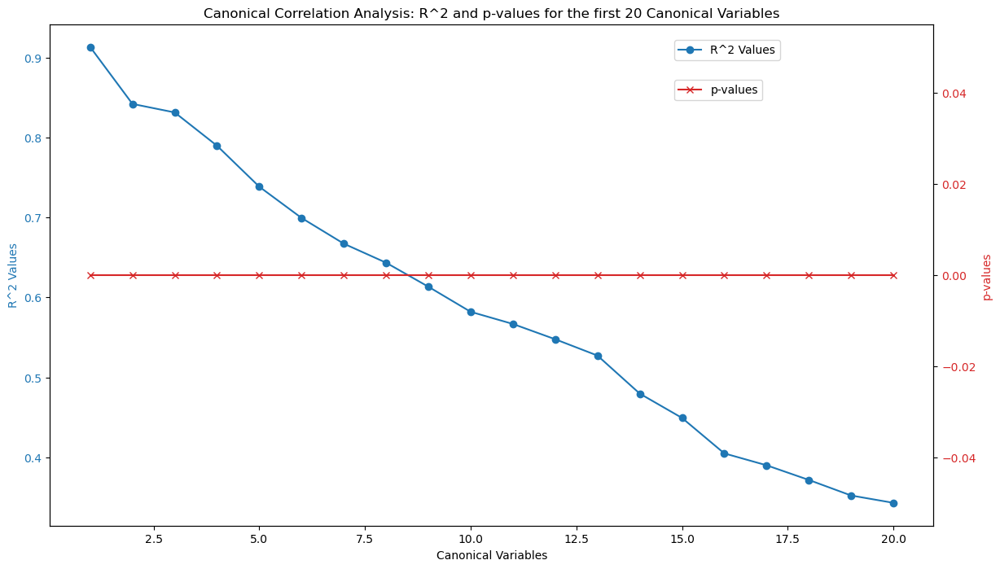

In [53]:
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

ax1.set_xlabel('Canonical Variables')
ax1.set_ylabel('R^2 Values', color='tab:blue')
ax1.plot(range(1, 21), R2_values, 'o-', color='tab:blue', label='R^2 Values')
ax1.tick_params(axis='y', labelcolor='tab:blue')

ax2 = ax1.twinx()
ax2.set_ylabel('p-values', color='tab:red')
ax2.plot(range(1, 21), p_values, 'x-', color='tab:red', label='p-values')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Legends and title
ax1.legend(loc='upper left', bbox_to_anchor=(0.7, 0.98))
ax2.legend(loc='upper left', bbox_to_anchor=(0.7, 0.9))
plt.title('Canonical Correlation Analysis: R^2 and p-values for the first 20 Canonical Variables')

plt.show()
#p value simply because we have so many samples, so even if there is a small correlation, it will be significant

In [1]:
#also calculate the RV coefficient

import numpy as np
import os
os.chdir('/home/sat4017/prot_project/')
from utils import LoadData

def rv_coefficient(X, Y):
    X_centered = X
    Y_centered = Y

    XX = np.dot(X_centered, X_centered.T)
    YY = np.dot(Y_centered, Y_centered.T)
    # XY = np.dot(X_centered.T, Y_centered)
    # YX = np.dot(Y_centered.T, X_centered)

    numerator = np.trace(np.dot(XX, YY))
    denominator = np.sqrt(np.trace(XX)**2 * np.trace(YY)**2)

    return numerator / denominator

loader = LoadData()
X = loader.m
Y = loader.p

print("RV coefficient:", rv_coefficient(X, Y))
#memory issues
#doesn't make sense 

RV coefficient: 0.0062662054827808435


In [2]:
#let's do it in sklearn as well
from sklearn.cross_decomposition import PLSCanonical
plsca = PLSCanonical(n_components=2)
plsca.fit(X,Y)
print('rv_coefficient', plsca.score(X,Y))

rv_coefficient -0.07027776243061237


In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
os.chdir('/home/sat4017/prot_project/')
from utils import LoadData

loader = LoadData()
X = loader.m
Y = loader.p



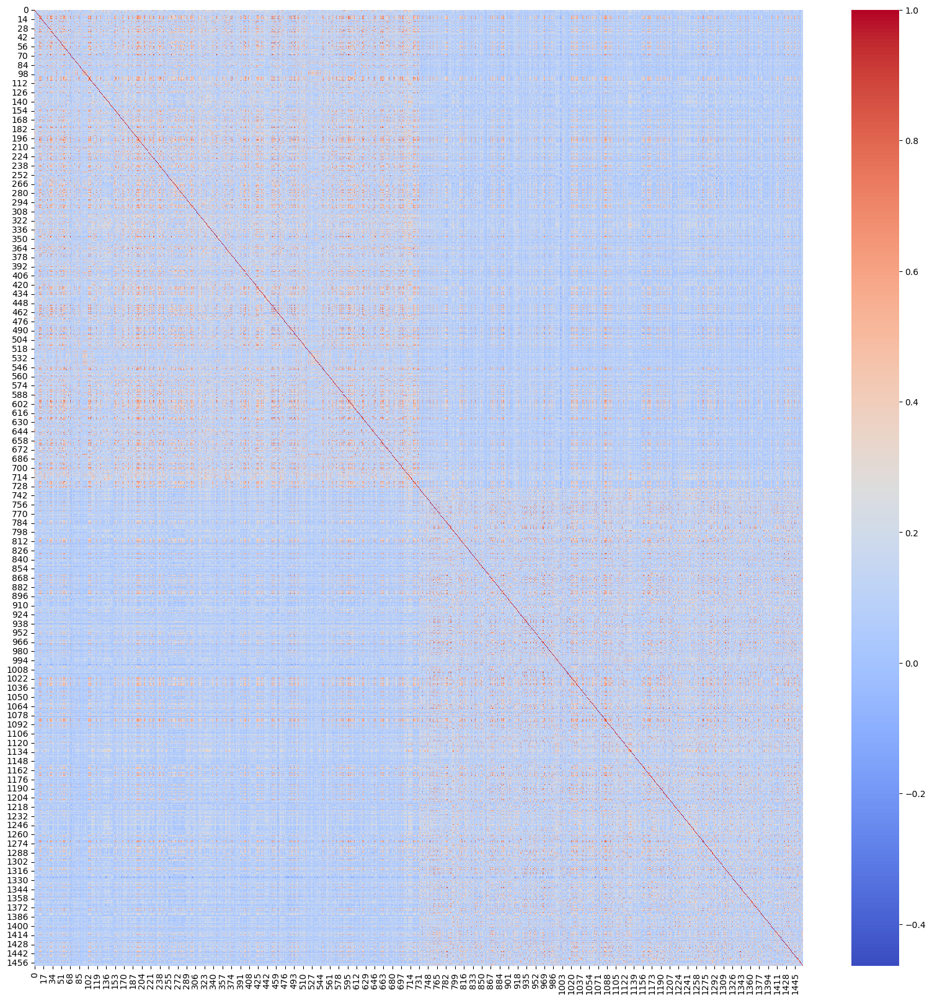

In [2]:
# Assuming df is your DataFrame
# Calculate the correlation matrix
df = pd.DataFrame(Y)
corr_matrix = df.corr()

# Create the heatmap
plt.figure(figsize=(20, 20))  # You can adjust the figure size as needed
sns.heatmap(corr_matrix,
            annot=False,      # Turn this to True if you want annotations inside the squares
            cmap='coolwarm')

# Show the plot
plt.show()


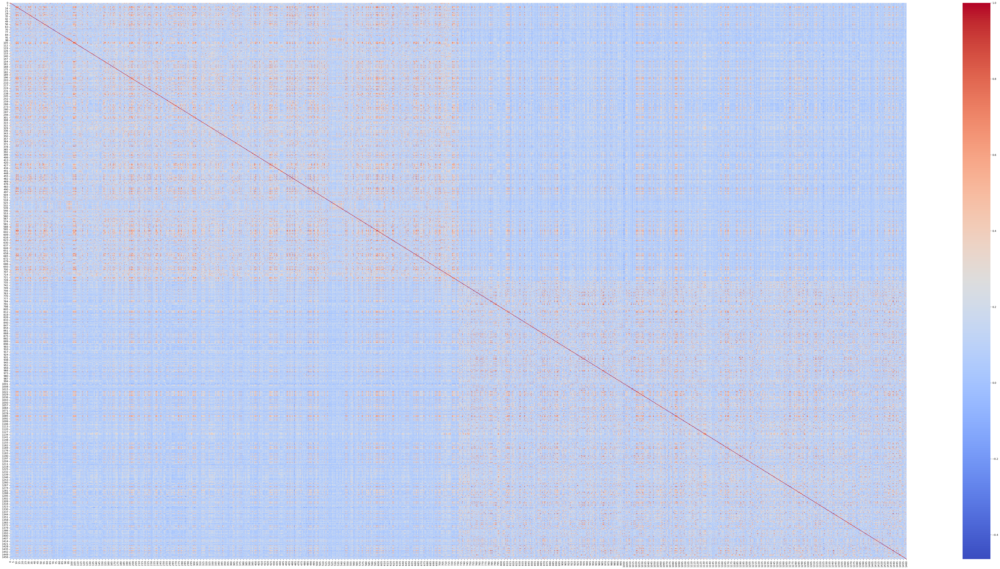

In [5]:
plt.figure(figsize=(80, 40))  # You can adjust the figure size as needed
sns.heatmap(corr_matrix,
            annot=False,      # Turn this to True if you want annotations inside the squares
            cmap='coolwarm')

# Show the plot
plt.show()


In [7]:
fig, ax = plt.subplots(figsize=(80, 50), dpi=500)  # You can adjust the size and DPI

# Draw the heatmap
sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap='coolwarm', cbar=True, ax=ax)

plt.savefig('large_olink_heatmap.png', dpi=500)
plt.close(fig)

In [8]:
#remove the diagonals and see what happens, set the diagonals to 0
corr_matrix.values[[np.arange(corr_matrix.shape[0])]*2] = 0
#print max of corr_matrix
print(np.max(corr_matrix.values))

0.0


In [ ]:
df = pd.DataFrame(Y)
corr_matrix = df.corr()